# Real-time Implementation and Automation with Oanda 

--------------------------------------------------------------------------------------------------------------------

_Disclaimer: <br>
The following illustrative examples are for general information and educational purposes only. <br>
It is neither investment advice nor a recommendation to trade, invest or take whatsoever actions.<br>
The below code should only be used in combination with an Oanda Practice/Demo Account and NOT with a Live Trading Account._

------------------------------------------------------------------------------------

## Recap: Historical Data, real-time Data and Orders

In [1]:
import pandas as pd
import tpqoa

In [8]:
configfile = "../../../../../oanda-live.cfg"

In [9]:
api = tpqoa.tpqoa(configfile)

__Load Signal Data__

In [133]:
signal_df = pd.read_csv("2049959.history.csv", delimiter=";", parse_dates=True, infer_datetime_format=True)

/var/folders/xf/zzkmjz4s1k5_37s8l49r7z_r0000gn/T/ipykernel_29512/1655381148.py:1: FutureWarning:

The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.



In [134]:
signal_df.loc[:, "Time"] = pd.to_datetime(signal_df.Time ,format= '%Y.%m.%d %H:%M:%S', utc=True).dt.floor("min")
signal_df.loc[:, "Time1"] = pd.to_datetime(signal_df["Time.1"] ,format= '%Y.%m.%d %H:%M:%S', utc=True).dt.floor("min")

In [135]:
signal_tps = signal_df.loc[signal_df.Comment == "[tp]"]

In [136]:
signal_tps = signal_tps.set_index("Time")

__Historical Data__

In [137]:
from datetime import datetime

In [138]:
import pandas_ta as ta

In [139]:
df = api.get_history(instrument = "EUR_USD", start = "2023-12-29", end = datetime.now().strftime('%Y-%m-%d'),
                granularity = "M1", price = "M", localize = False)


In [140]:
df = df.rename({"o": "open", "h": "high", "l": "low", "c": "close"}, axis=1)

In [141]:
df = df.assign(rsi=df.ta.rsi(14))
df = df.assign(rsi_ma=df.ta.sma(length=14, close=df.rsi))

In [ ]:
entry_index = signal_tps.index.intersection(df.index)

In [142]:
signal_tps = signal_tps.assign(color=signal_tps.Type.map({"Buy": "blue", "Sell": "purple"}))

In [147]:
signal_tps = signal_tps.loc[signal_tps.index > df.index[0]]

In [162]:
signal_tps = signal_tps.assign(trade_id=list(reversed(list(range(signal_tps.shape[0])))))

In [171]:
import numpy as np

In [183]:
signal_tps = signal_tps.assign(marker_size=np.log(signal_tps.Volume * 10000) * 2)

In [190]:
signal_tps = signal_tps.assign(profit_color=signal_tps.Profit.map(lambda x: "green" if float(x) > 0 else "red"))

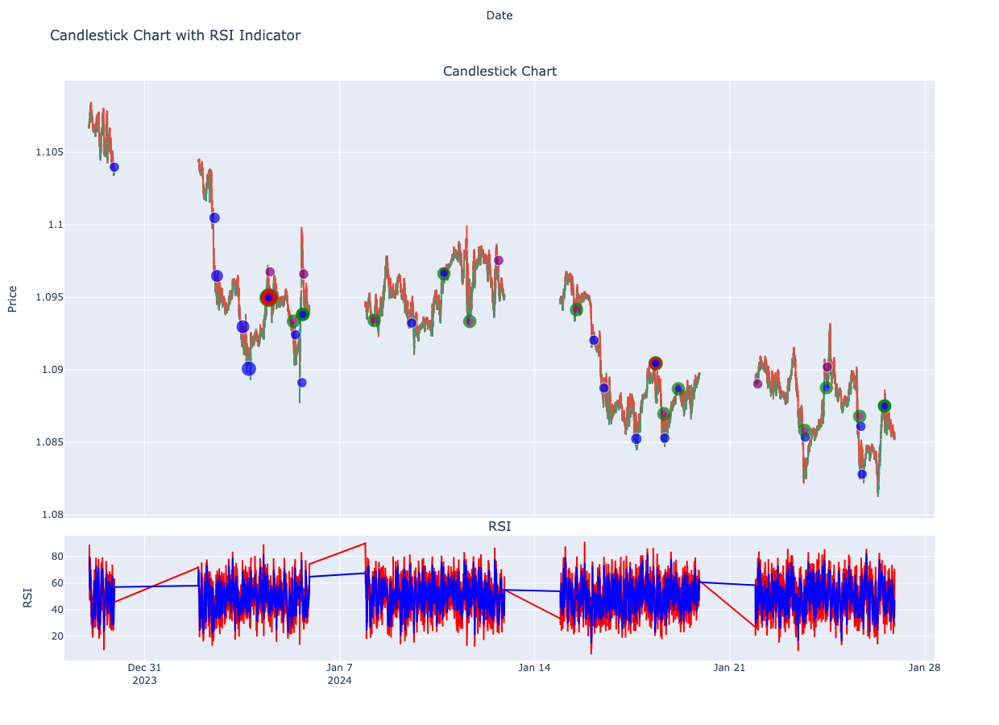

In [192]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming df is your DataFrame with the columns 'open', 'close', 'high', 'low', and 'rsi'

# Create a subplot with 2 rows and 1 column
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.03, subplot_titles=('Candlestick Chart', 'RSI'), row_width=[0.2, 0.7])

# Add the candlestick chart in the first row
fig.add_trace(go.Candlestick(x=df.index,
                open=df['open'],
                high=df['high'],
                low=df['low'],
                close=df['close']), row=1, col=1)


text = "id: " + signal_tps.trade_id.astype(str) + " profit: " + signal_tps.Profit.astype(str) + " size: " + signal_tps.Volume.astype(str)

fig.add_trace(go.Scatter(x=signal_tps.index, y=signal_tps.Price, mode='markers', name='entry', text=text,  marker=dict(color=signal_tps.color, size=signal_tps.marker_size)), row=1, col=1)
fig.add_trace(
    go.Scatter(x=signal_tps["Time1"], y=signal_tps["Price.1"], mode='markers', name='exit', text=text,
               marker=dict(color=signal_tps.color, size=signal_tps.marker_size, line=dict(width=4, color=signal_tps.profit_color)))
    , row=1, col=1)


# Add the RSI indicator in the second row
fig.add_trace(go.Scatter(x=df.index, y=df['rsi'], mode='lines', name='RSI', line=dict(color='red')), row=2, col=1)
fig.add_trace(go.Scatter(x=df.index, y=df['rsi_ma'], mode='lines', name='RSI MA', line=dict(color='blue')), row=2, col=1)


# Update layout
fig.update_layout(title='Candlestick Chart with RSI Indicator',
                  xaxis_title='Date',
                  yaxis_title='Price',
                  showlegend=False)

# Update y-axis label for RSI
fig.update_yaxes(title_text="RSI", row=2, col=1)

# Hide range slider for RSI
fig.update_layout(xaxis_rangeslider_visible=False, height=900)

fig.show()


In [29]:
type(df.index[0])

pandas._libs.tslibs.timestamps.Timestamp

In [ ]:
df = df.rename({"o": "open", "h": "high", "l": "low", "c": "close"}, axis=1)

In [ ]:
df = df.assign(rsi=df.ta.rsi(14))

In [ ]:
import plotly.graph_objects as go

In [ ]:
fig = go.Figure()

fig.add_trace(
    go.Scattergl(
        x=df.index, y=df.rsi, mode="lines", marker=dict(color="red")
    )
)
fig.add_trace(
    go.Scattergl(
        x=df.index, y=df.rsi_ma, mode="lines", marker=dict(color="blue")
    )
)
fig.add_trace(
    go.Scattergl(
        x=df.index[df.positions == -1], y=df.loc[df.positions == -1, "rsi_ma"], mode="markers", marker=dict(color="green")
    )
)
fig       

In [ ]:
from datetime import datetime
import datetime as dt

mask = (datetime(2024, 1, 1, 23, 13, tzinfo=dt.timezone.utc) > df.index) & (df.index > datetime(2024, 1, 1, 23, 9, tzinfo=dt.timezone.utc))

In [ ]:
df.loc[mask]

In [ ]:
datetime(2024, 1, 1, 23, 11, tzinfo=dt.timezone.utc) > df.index

## Preview: A Trader Class live in action

In [ ]:
configfile = "../../../oanda-live.cfg"

In [ ]:
configfile = "../../../oanda.cfg"

In [ ]:
import pandas as pd
import numpy as np
import tpqoa
from datetime import datetime, timedelta
import time
import pandas_ta as ta

In [ ]:
import numpy as np

def rsi_positions(
    df, instrument, rsi_high_thresh=50, rsi_low_thresh=30, adx_length=200, dm_diff_thresh=0,
    atr_period=14, atr_stop_multiplier=12, use_session=True
):
    if use_session:
        start_time = 12 * 60 + 30
        end_time = 21 * 60
        translated_time = (df.index.hour * 60 + df.index.minute)
        in_session = (translated_time > start_time) & (translated_time < end_time)
    else:
        in_session = False
    #df = df.rename({instrument: "close"}, axis=1)#,"o": "open", "h": "high", "l": "low", "c": "close"}, axis=1)
    df = df.assign(
        rsi=df.ta.rsi(14),
        atr=df.ta.atr(atr_period),
        position=None,
        in_session=in_session,
        translated_time=translated_time
    )
    df = df.assign(
        stop=df.atr * atr_stop_multiplier,
    )
    df = df.assign(rsi_ma=df.ta.sma(length=14, close=df.rsi))
    df = df.assign(last_rsi=df.rsi.shift())
    adx = df.ta.adx(length=adx_length)
    df = df.assign(dm_diff=adx.iloc[:, -2] - adx.iloc[:, -1])

    entries = (df.last_rsi > df.rsi_ma) & (df.rsi < df.rsi_ma) & (df.rsi > rsi_high_thresh) & (df.dm_diff < dm_diff_thresh) & df.in_session
    df.loc[entries, "position"] = -1
    df.loc[df.rsi < rsi_low_thresh, "position"] = 0
    df = df.assign(position=df.position.ffill())
    df = df.assign(position=df.position.fillna(0))
    df = df.assign(last_position=df.position.shift())
    return df

def rsi_positions_long(
    df, instrument, rsi_high_thresh=65, rsi_low_thresh=45, adx_length=200, dm_diff_thresh=0,
    atr_period=14, atr_stop_multiplier=12
):
    #df = df.rename({instrument: "close"}, axis=1)#,"o": "open", "h": "high", "l": "low", "c": "close"}, axis=1)
    df = df.assign(
        rsi=df.ta.rsi(14),
        atr=df.ta.atr(atr_period),
        position=None
    )
    df = df.assign(
        stop=df.atr * atr_stop_multiplier,
    )
    df = df.assign(rsi_ma=df.ta.sma(length=14, close=df.rsi))
    df = df.assign(last_rsi=df.rsi.shift())
    adx = df.ta.adx(length=adx_length)
    df = df.assign(dm_diff=adx.iloc[:, -2] - adx.iloc[:, -1])

    entries = (df.last_rsi < df.rsi_ma) & (df.rsi > df.rsi_ma) & (df.rsi < rsi_low_thresh) & (df.dm_diff > dm_diff_thresh)
    df.loc[entries, "position"] = 1
    df.loc[df.rsi > rsi_high_thresh, "position"] = 0
    df = df.assign(position=df.position.ffill())
    df = df.assign(position=df.position.fillna(0))
    df = df.assign(last_position=df.position.shift())
    return df

# work in progress
def rsi_positions_long_short(
    df, instrument,
    rsi_high_thresh_short=55, rsi_low_thresh_short=35,
    rsi_high_thresh_long=65, rsi_low_thresh_long=45,
    adx_length=200, dm_diff_thresh=0,
    atr_period=14, atr_stop_multiplier=12
):
    #df = df.rename({instrument: "close"}, axis=1)#,"o": "open", "h": "high", "l": "low", "c": "close"}, axis=1)
    df = df.assign(
        rsi=df.ta.rsi(14),
        atr=df.ta.atr(atr_period),
        position=None
    )
    df = df.assign(
        stop=df.atr * atr_stop_multiplier,
    )
    df = df.assign(rsi_ma=df.ta.sma(length=14, close=df.rsi))
    df = df.assign(last_rsi=df.rsi.shift())
    adx = df.ta.adx(length=adx_length)
    df = df.assign(dm_diff=adx.iloc[:, -2] - adx.iloc[:, -1])

    entries = (df.last_rsi < df.rsi_ma) & (df.rsi > df.rsi_ma) & (df.rsi < rsi_low_thresh_long) & (df.dm_diff > dm_diff_thresh)
    df.loc[entries, "position"] = 1
    df.loc[df.rsi > rsi_high_thresh_long, "position"] = 0
    entries = (df.last_rsi > df.rsi_ma) & (df.rsi < df.rsi_ma) & (df.rsi > rsi_high_thresh_short) & (df.dm_diff < dm_diff_thresh)
    df.loc[entries, "position"] = -1
    df.loc[df.rsi < rsi_low_thresh_short, "position"] = 0
    df = df.assign(position=df.position.ffill())
    df = df.assign(position=df.position.fillna(0))
    df = df.assign(last_position=df.position.shift())
    return df





def rsi_trade_report(time, df):
    last_row = df.iloc[-1]
    print("{} | rsi = {} | prev rsi = {} | rsi ma = {}".format(time, last_row.rsi, last_row.last_rsi, last_row.rsi_ma))

In [ ]:
import pytz

class Trader(tpqoa.tpqoa):
    def __init__(self, conf_file, instrument, bar_length, window, units,
                 stop_loss=50, indicators=["rsi", "last_rsi", "rsi_ma", "dm_diff", "position", "last_position", "atr", "stop", "in_session", "translated_time"],
                 trade_reporter=rsi_trade_report, strategy=rsi_positions,
                 use_account_position=True,
                 spread_threshold=0.05,
                 tick_decimals=3,
                 **strategy_kwargs):
        super().__init__(conf_file)
        self.instrument = instrument
        self.bar_length = pd.to_timedelta(bar_length)
        self.tick_data = pd.DataFrame()
        self.raw_data = None
        self.data = None 
        self.last_bar = None
        self.units = units
        self.position = 0
        self.profits = []
        self.strategy = strategy
        self.indicators = indicators
        self.trade_reporter = trade_reporter
        self.use_account_position = use_account_position
        self.strategy_kwargs = strategy_kwargs
        self.stop_loss = stop_loss
        self.account_position = None
        self.spread = None
        self.spread_threshold = spread_threshold
        self.start_time = pd.Timestamp(datetime.utcnow(), tz=pytz.timezone("UTC"))
        self.tick_decimals = tick_decimals
        
        #*****************add strategy-specific attributes here******************
        self.window = window
        #************************************************************************
        self.set_positions()
    
    def get_most_recent(self, days = 5, columns=["open", "high", "low", "close"]):
        while True:
            time.sleep(2)
            now = datetime.utcnow()
            now = now - timedelta(microseconds = now.microsecond)
            past = now - timedelta(days = days)
            df = self.get_history(instrument = self.instrument, start = past, end = now,
                                   granularity = "S5", price = "M", localize = False).dropna(subset="c")
            df.rename(columns = {"c": "close", "o": "open", "h": "high", "l": "low"}, inplace = True)
            df = df.assign(**{self.instrument: df.close})[columns + [self.instrument]]
            df = df.resample(self.bar_length, label = "right").last().dropna().iloc[:-1]
            self.raw_data = df.copy()
            self.last_bar = self.raw_data.index[-1]
            if pd.to_datetime(datetime.utcnow()).tz_localize("UTC") - self.last_bar < self.bar_length:
                break
                
    def on_success(self, time, bid, ask):
        #print(self.ticks, end = " ")
        recent_tick = pd.to_datetime(time)
        mid = (ask + bid)/2
        df = pd.DataFrame(
            {
                self.instrument: mid,
                "open": mid,
                "high": mid,
                "low": mid,
                "close": mid
            }, 
            index = [recent_tick]
        )
        self.tick_data = pd.concat([self.tick_data, df])
        self.spread = ask - bid
        
        if recent_tick - self.last_bar > self.bar_length:
            self.resample_and_join()
            self.define_strategy()
            self.execute_trades()
    
    def resample_and_join(self):
        self.raw_data = pd.concat([
            self.raw_data, self.tick_data.resample(
                self.bar_length, 
                label="right"
            ).agg(
                {
                    self.instrument: "last",
                    "open": "first",
                    "high": "max",
                    "low": "min",
                    "close": "last",
                }
            ).ffill().iloc[:-1]])
        self.tick_data = self.tick_data.iloc[-1:]
        self.last_bar = self.raw_data.index[-1]
    
    def define_strategy(self): # "strategy-specific"
        df = self.raw_data.copy()
        
        #******************** define your strategy here ************************
        df["returns"] = np.log(df[self.instrument] / df[self.instrument].shift())
        #df["position"] = -np.sign(df.returns.rolling(self.window).mean())
        df = self.strategy(df, self.instrument, **self.strategy_kwargs)
        #***********************************************************************
        indicator_string = f"{df.index[-1]} "
        for indicator in self.indicators:
            val = df.iloc[-1][indicator] if indicator in df.columns else None
            indicator_string += f"{indicator}: {val} "
        indicator_string += f"account position: {self.account_position}"
        indicator_string += f" spread: {self.spread:.4f}"
        print(indicator_string, end='\r')
        
        self.data = df.copy()


    def set_positions(self):
        account_summary = self.get_account_summary(detailed=True)
        for position in account_summary["positions"]:
            if position["instrument"] == self.instrument:
                long_units = float(position["long"]["units"])
                short_units = float(position["short"]["units"])
                if long_units > 0:
                    self.account_position = long_units
                    if self.use_account_position:
                        self.position = 1
                elif short_units < 0:
                    self.account_position = short_units
                    if self.use_account_position:
                        self.position = -1
                else:
                    self.account_position = 0
                    if self.use_account_position:
                        self.position = 0
                break
    
    def execute_trades(self):
        self.set_positions()
        last_netrual = self.data["position"].iloc[-2] == 0
        stop = str(round(self.data["stop"].iloc[-1], self.tick_decimals))
        spread_check = self.spread < self.spread_threshold
        if self.data["position"].iloc[-1] == 1 and last_netrual and spread_check:
            if self.position == 0:
                order = self.create_order(
                    self.instrument, self.units, suppress = True, ret = True,
                    sl_distance=stop if self.stop_loss else None
                    # sl_distance=round((.01 * self.stop_loss), 2) if self.stop_loss else None
                )
                self.report_trade(order, "GOING LONG")
            elif self.position == -1:
                order = self.create_order(
                    self.instrument, self.units * 2,
                    sl_distance=stop if self.stop_loss else None,
                    suppress = True, ret = True
                ) 
                self.report_trade(order, "GOING LONG")
            self.position = 1
        elif self.data["position"].iloc[-1] == -1 and last_netrual and spread_check:
            print("stop")
            if self.position == 0:
                order = self.create_order(
                    self.instrument, -self.units, suppress = True, ret = True,
                    sl_distance=stop if self.stop_loss else None
                    # sl_distance=round((.01 * self.stop_loss), 2) if self.stop_loss else None
                )
                print("order is ", order)
                self.report_trade(order, "GOING SHORT")
            elif self.position == 1:
                order = self.create_order(
                    self.instrument, -self.units * 2,
                    sl_distance=stop if self.stop_loss else None,
                    suppress = True, ret = True
                )
                self.report_trade(order, "GOING SHORT")
            self.position = -1
        elif self.data["position"].iloc[-1] == 0 and self.position != 0:
            # update this to use units if self.use_account_position is False
            order = trader.create_order(
                trader.instrument, 
                -trader.account_position if self.use_account_position else (-self.position * self.units),
                suppress = True,
                ret = True
            ) 
            if self.position == -1:
                self.report_trade(order, "GOING NEUTRAL")
            elif self.position == 1:
                self.report_trade(order, "GOING NEUTRAL")
            self.position = 0
    
    def report_trade(self, order, going):
        print("order", order)
        time = order["time"]
        units = order["units"]
        price = order["price"]
        pl = float(order["pl"])
        self.profits.append(pl)
        cumpl = sum(self.profits)
        print("\n" + 100* "-")
        print("{} | {}".format(time, going))
        print("{} | units = {} | price = {} | P&L = {} | Cum P&L = {}".format(time, units, price, pl, cumpl))
        self.trade_reporter(time, self.data)
        print(100 * "-" + "\n")  
    

Simple Contrarian: Bar_lenght = 1min | Window = 1 (1 minute)

short

In [ ]:
trader = Trader(configfile, "GBP_JPY", bar_length = "1min", window = 1, units = 20000, rsi_high_thresh=55, rsi_low_thresh=35)

long

In [ ]:
trader = Trader(configfile, "GBP_JPY", bar_length = "1min", window = 1, units = 40000, strategy=rsi_positions_long, rsi_high_thresh=65, rsi_low_thresh=45, use_account_position=True)

In [ ]:
trader = Trader(configfile, "EUR_USD", bar_length = "1min", window = 1, units = 40000, strategy=rsi_positions, tick_decimals=4, rsi_high_thresh=55, rsi_low_thresh=35, use_account_position=True)

In [ ]:
while True:
    try:
        trader.get_most_recent()
        trader.stream_data(trader.instrument)#, stop = 200)
        # if trader.position != 0: # if we have a final open position
        #     close_order = trader.create_order(trader.instrument, units = -trader.position * trader.units, 
        #                                       suppress = True, ret = True) 
        #     trader.report_trade(close_order, "GOING NEUTRAL")
        #     trader.position = 0
    except Exception as e:
        print("Encountered error")
        print(str(e))
        time.sleep(2)